In [19]:
import pandas as pd
from youtube_transcript_api import YouTubeTranscriptApi
from google import genai
from fpdf import FPDF
#Importar stopwords en español
from nltk.corpus import stopwords
from nltk import ngrams
from nltk import FreqDist
from nltk.tokenize import word_tokenize
from collections import Counter
import networkx as nx
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import matplotlib.cm as cm
from PIL import ImageDraw
import re
import string
from youtube_transcript_api._errors import TranscriptsDisabled, VideoUnavailable, NoTranscriptFound
import time


In [20]:
###Diccionario con urls de los videos

videos = {"Miguel Hidalgo": "Bl4v2H-IrFo&t=414s",
          "Iztacalco": "w1OEQFnOE8A",
          "Milpa Alta": "FFCq9JkpC8s",
          "Tlahuac": "_FzsMDACXHQ",
          "Gustavo A. Madero": "6xu9oVZn2RE",
          "Coyoacán": "7QPQ75lmeb4",
          "Iztapalapa": "HDomj4vgE5Q&t=3549s",
          "Magdalena Contreras": "FS6wACZ9XFs",
          "Cuauhtémoc": "XYu87vrlhGU",
          "Benito Juárez": "pRPAeRVNR5M",
          "Azcapotzalco": "cUcUv1Wm2FA",
          "Álvaro Obregón": "IN5uGMU8X2w",
          "Tlalpan": "f9v8HeNt1uU",
          "Xochimilco": "Io6tPWuNcwE",
          "Cuajimalpa": "Ii9CjuVrfMo",
          "Venustiano Carranza": "yOGUC3dfh-U"
          }

In [21]:
def extraer_y_limpiar_transcripcion(codigo_video, stopwords):
    """
    Descarga el transcript de un video de YouTube y devuelve el texto limpio.
    """
    # Obtener transcripción
    srt = YouTubeTranscriptApi.get_transcript(codigo_video, languages=['es'])

    # Unir todos los textos
    texto = " ".join([item['text'] for item in srt])

    # Limpieza básica
    texto = texto.lower()
    texto = texto.replace('\n', ' ').replace('\r', ' ')
    texto = texto.replace('[música]', '').replace('[risas]', '').replace('congreso tv presentó', '')
    texto = texto.replace('magdalena contreras', '').replace('cuahtemoc', '').replace('benito juarez', '')
    texto = texto.replace('iztapalapa', '').replace('tlalpan', '').replace('miguel hidalgo', '')
    texto = texto.replace('cuajimalpa', '').replace('xochimilco', '').replace('venustiano carranza', '')
    texto = texto.replace('alvaro obregon', '')

    # Sustituir acentos y ñ
    acentos = {'á':'a', 'é':'e', 'í':'i', 'ó':'o', 'ú':'u', 'ñ':'n'}
    for acento, plano in acentos.items():
        texto = texto.replace(acento, plano)

    # Tokenización
    tokens = word_tokenize(texto, language='spanish', preserve_line=True)

    # Limpiar puntuación de cada token
    tokens = [re.sub(rf"[{re.escape(string.punctuation)}]", "", word) for word in tokens]

    # Eliminar tokens vacíos y stopwords
    tokens_limpios = [word for word in tokens if word and word.isalpha() and word not in stopwords]

    return ' '.join(tokens_limpios)

In [22]:
def extraer_y_limpiar_transcripcion(video_id, stopwords, max_reintentos=10, espera=5):
    intentos = 0
    while True:
        try:
            srt = YouTubeTranscriptApi.get_transcript(video_id, languages=['es'])
            texto = " ".join([item['text'] for item in srt])
            texto = texto.lower()
            texto = texto.replace('\n', ' ').replace('\r', ' ')
            texto = texto.replace('[música]', '').replace('[risas]', '').replace('congreso tv presentó', '')
            texto = texto.replace('magdalena contreras', '').replace('cuahtemoc', '').replace('benito juarez', '')
            texto = texto.replace('iztapalapa', '').replace('tlalpan', '').replace('miguel hidalgo', '')
            texto = texto.replace('cuajimalpa', '').replace('xochimilco', '').replace('venustiano carranza', '')
            texto = texto.replace('alvaro obregon', '')

            acentos = {'á': 'a', 'é': 'e', 'í': 'i', 'ó': 'o', 'ú': 'u', 'ñ': 'n'}
            for acento, plano in acentos.items():
                texto = texto.replace(acento, plano)

            from nltk.tokenize import word_tokenize
            tokens = word_tokenize(texto, language='spanish', preserve_line=True)
            tokens_limpios = [word for word in tokens if word.isalpha() and word not in stopwords]
            return ' '.join(tokens_limpios)

        except (NoTranscriptFound, VideoUnavailable, TranscriptsDisabled) as e:
            raise e  # No vale la pena seguir intentando
        except Exception as e:
            intentos += 1
            if intentos >= max_reintentos:
                raise Exception(f"No se pudo obtener transcript tras {max_reintentos} intentos: {e}")
            print(f"⏳ Reintentando extracción de transcript ({intentos})... Esperando {espera} segundos")
            time.sleep(espera)

In [23]:
def generar_nube_palabras(texto, max_palabras=100, diametro=800):
    """
    Genera una nube de palabras con forma circular y colores tipo Yellow-Orange-Red.

    Parámetros:
    - texto: str. Texto limpio.
    - max_palabras: int. Número máximo de palabras.
    - diametro: int. Tamaño del lienzo cuadrado para la máscara circular (en píxeles).

    Retorna:
    - None. Muestra la nube de palabras.
    """


    # Crear un mapa de colores (colormap) tipo Yellow-Orange-Red
    colormap = cm.get_cmap("YlOrRd")

    # Crear la nube de palabras
    wc = WordCloud(
        background_color="black",
        max_words=max_palabras,
        colormap="YlOrRd",  # Paleta de colores
        collocations=False,
        
    ).generate(texto)

    # Mostrar
    plt.figure(figsize=(6, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title("Nube de Palabras (Forma Circular)", fontsize=16)
    plt.tight_layout()
    plt.show()

In [24]:
def graficar_ngrama(texto, n=2, top=40, k_layout=1.5):
    """
    Genera y muestra un grafo de co-ocurrencias de n-gramas.

    Parámetros:
    - texto: str. Texto limpio.
    - n: int. Tamaño del n-grama (2=bigramas, 3=trigramas).
    - top: int. Número de n-gramas más frecuentes a visualizar.
    - k_layout: float. Separación entre nodos (más alto = más separación).

    Retorna:
    - None. Muestra el gráfico.
    """
    # Crear ngramas
    lista_ngrama = list(ngrams(texto.split(), n))
    contador = Counter(lista_ngrama)
    top_ngrama = contador.most_common(top)

    # Crear grafo
    G = nx.Graph()
    for grama, peso in top_ngrama:
        for i in range(len(grama) - 1):
            G.add_edge(grama[i], grama[i + 1], weight=peso)

    # Visualización
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(G, k=k_layout)  # más k = más espacio entre nodos
    edges = G.edges(data=True)
    pesos = [d['weight'] for (_, _, d) in edges]

    nx.draw_networkx_nodes(G, pos, node_size=700, node_color="skyblue")
    nx.draw_networkx_edges(G, pos, width=pesos, edge_color="gray", alpha=0.6)
    nx.draw_networkx_labels(G, pos, font_size=12, font_family="sans-serif")

    plt.title(f"Red de co-ocurrencias ({n}-gramas)", fontsize=14)
    plt.axis("off")
    plt.figtext(
        0.5, -0.05,
        f"Los nodos representan palabras y los bordes representan co-ocurrencias consecutivas en los {n}-gramas.",
        wrap=True, horizontalalignment='center', fontsize=10
    )
    plt.tight_layout()
    plt.show()


In [25]:
lista_palabras=["grupo", "parlamentario", "daniela","gracias","muchas","diputada","diputado","diputadas","buenas","buenos","chavez","licenciada","licenciado",
                "si","bien","forman","parte","millones","pesos","anos","hace","cada","vez","tambien","eh", "mas","pues","si","entonces","primer","trimestre",
                "todas","todas","toda","todo","todos","emilio","usted","dice","incluso","azcapozalco","solo","nancy","ademas","alcaldia","benito", "adelante","minutos","via",
                "juarez","entonces","alcalde","alcaldesa","cuautemoc","gustavo", "madero","amadero","itacalco","jefa","milpalta","coyoacan","gerardo","bienvenida","tener",
                "lourdes","decirle","cuales","ramos","dia", "dias","giovanni","lozano","reynoso","reinoso","ciudad","mexico","vecino","vecina","persona","ahi",
                "vecinos","vecinas","ciudadano","ciudadana","ciudadanos","ciudadanas","gobierno","rojo","vega","sanchez","decirles","va","cuenta","registrados","evely","israel","moreno",
                "diputados","presidenta","fernando","victor","manuel","usted","dice","agradezco","respuestas","respuesta","diego","garrido","damos","berenice", "hernandez",
                "janet","elizabeth","nunez","resendis","voy","bienvenido","bienvenida","bienvenida","gutierrez","cuanto","siempre","gran","pueblo","cuapa","leticia","aro",
                "magdalena","importante","guaida","todas","todas","toda","todo","todos","emilio","usted","dice","manera","giancarlos","tlagua","uso","concede","iliana","ivon",
                "ernesto","alejandro","alvaro","ser","ver","dos","omar","preguntas","pregunta","mauricio","tabe","fernanda","cantu","villarreal","gabriela","osorio",
                "pablo","trejo","aleida","erika","miriam","saldana","leonor", "gonzalez","loria","garcia","clara","otegui","rebeca","peralta","luz","medina","rosales",
                "preguntarle","queda","claro","llevado","cabo","dar","camacho","alcaldia","alcalde","gobierno","alcaldesa","parece","eje","ustedes","carmen","cerdan","alvarez","parra",
                "programa","programas","octavio","rivero", "villasenor","mil","palta","jose","mucha","ninos","ninas","luis","acevedo","miguel","luisa","maria","sigue","siendo",
                  "mendoza","da","tardes","hoy","tema","aqui","estan","estamos","estaba","esta","este","estos","estas","bueno","asi","andres","asi","gomez", "companeras","companeros",
                  "mas","alla","vamos","hacer","primero","entonces","porque","por","para","con","como","quien","quienes","quiero", "ano","continuacion","liset",
                  "quieres","quiero","quisiera","quisieras","quisiera","quisieran","quisimos","quisieron","quisiera","quisieron","junto","javier","lopez","casarin",
                  "quisiera","quisieras","quisiera","quisieran","quisimos","quisieron","quisiera","quisieron","quisiera","quisieras","haciendo","patricia","urriza",
                  "decir","decimos","decir","dijo","dijeron","diciendo","dicho","dicha","dichos","dichas","realmente","circe", "haciendo","parece","traves","santiago",
                  "equipo","trabajo","trabajamos","trabajar","trabajando","trabajamos","trabajaron","trabajaba","trabajaba","trabajo","trabajos","gomez","hugo","lobo",
                  "saber","gustaria","conocer","diana","sanchez","barrios","sochimilco","sido","embargo","carranza","sin","sabemos","verdad","simple","sencillamente",
                  "mercado","eh", "tambien","sino","palabra", "creo", "ahora","corresponde"]

In [26]:
# Lista de stopwords en español
stopwords = set(stopwords.words('spanish'))
#Ampliar la lista de stopwords
stopwords.update(lista_palabras)

🧾 Procesando alcaldía: Miguel Hidalgo
🧾 Procesando alcaldía: Iztacalco
🧾 Procesando alcaldía: Milpa Alta
🧾 Procesando alcaldía: Tlahuac
🧾 Procesando alcaldía: Gustavo A. Madero
⏳ Reintentando extracción de transcript (1)... Esperando 5 segundos
🧾 Procesando alcaldía: Coyoacán
🧾 Procesando alcaldía: Iztapalapa
🧾 Procesando alcaldía: Magdalena Contreras
🧾 Procesando alcaldía: Cuauhtémoc
🧾 Procesando alcaldía: Benito Juárez
⏳ Reintentando extracción de transcript (1)... Esperando 5 segundos
⏳ Reintentando extracción de transcript (2)... Esperando 5 segundos
🧾 Procesando alcaldía: Azcapotzalco


C:\Users\claud\AppData\Local\Temp\ipykernel_28276\3648067607.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 6))


🧾 Procesando alcaldía: Álvaro Obregón
🧾 Procesando alcaldía: Tlalpan
🧾 Procesando alcaldía: Xochimilco
🧾 Procesando alcaldía: Cuajimalpa
🧾 Procesando alcaldía: Venustiano Carranza


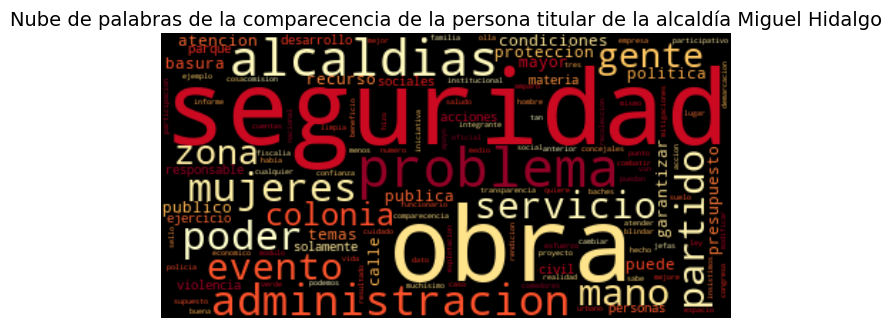

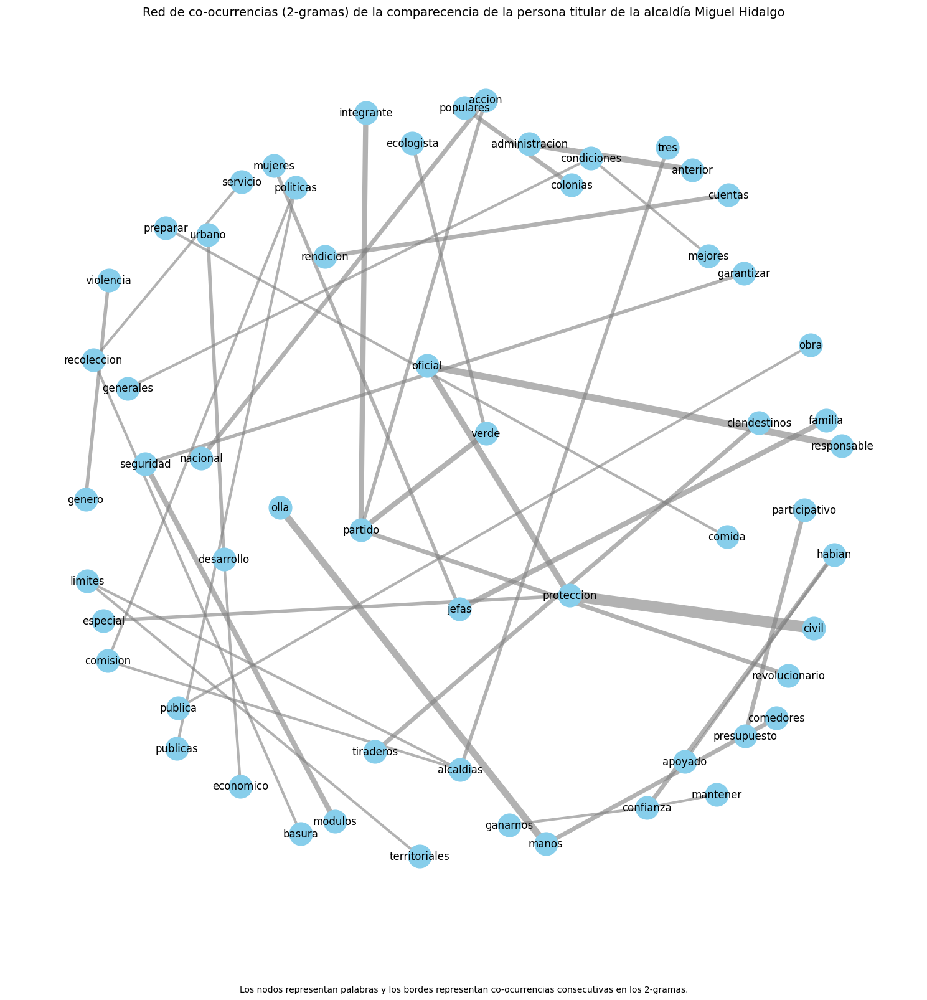

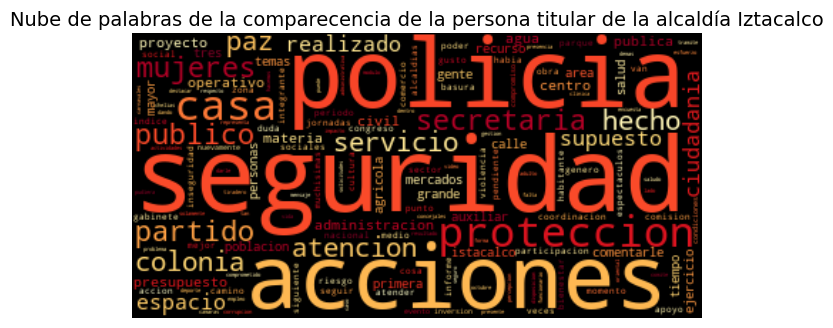

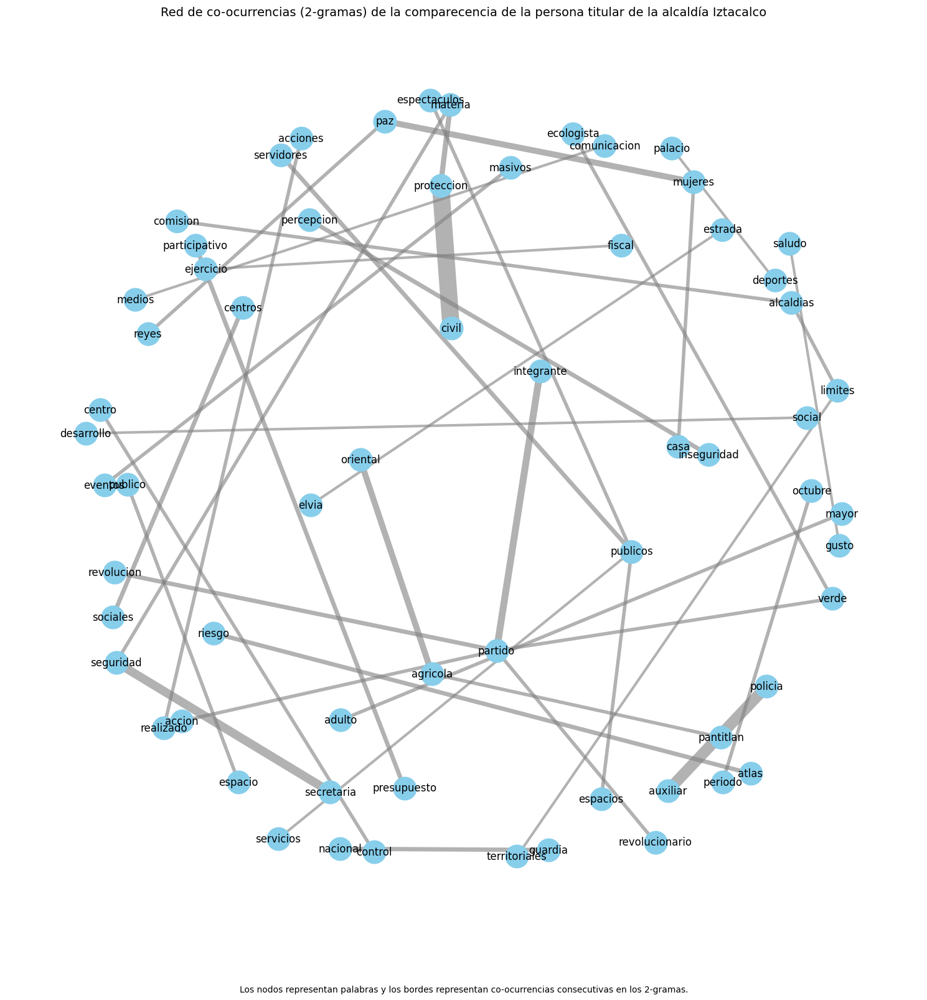

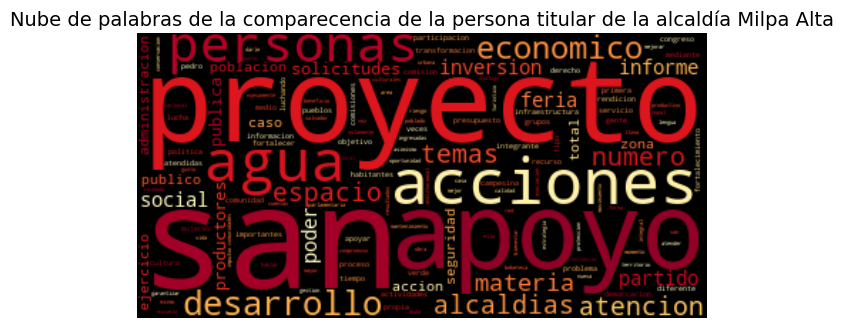

...

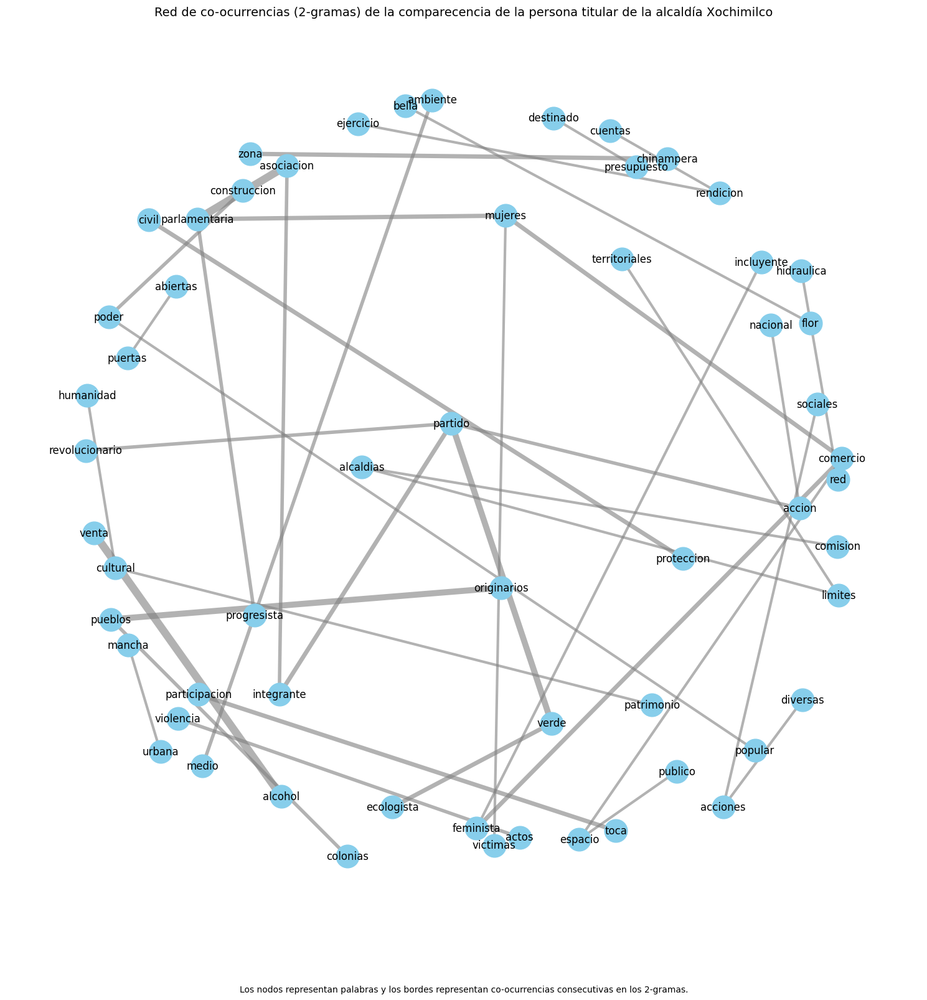

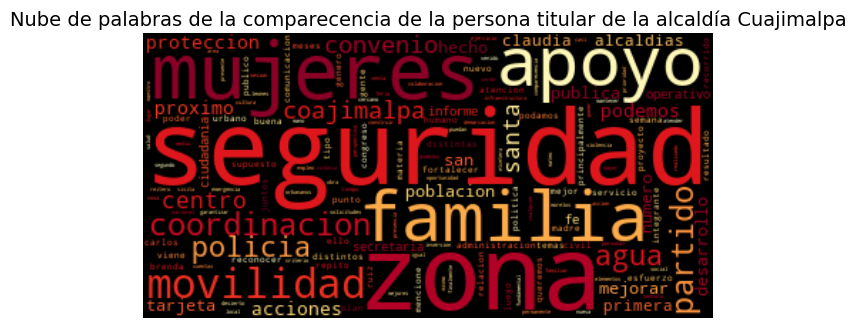

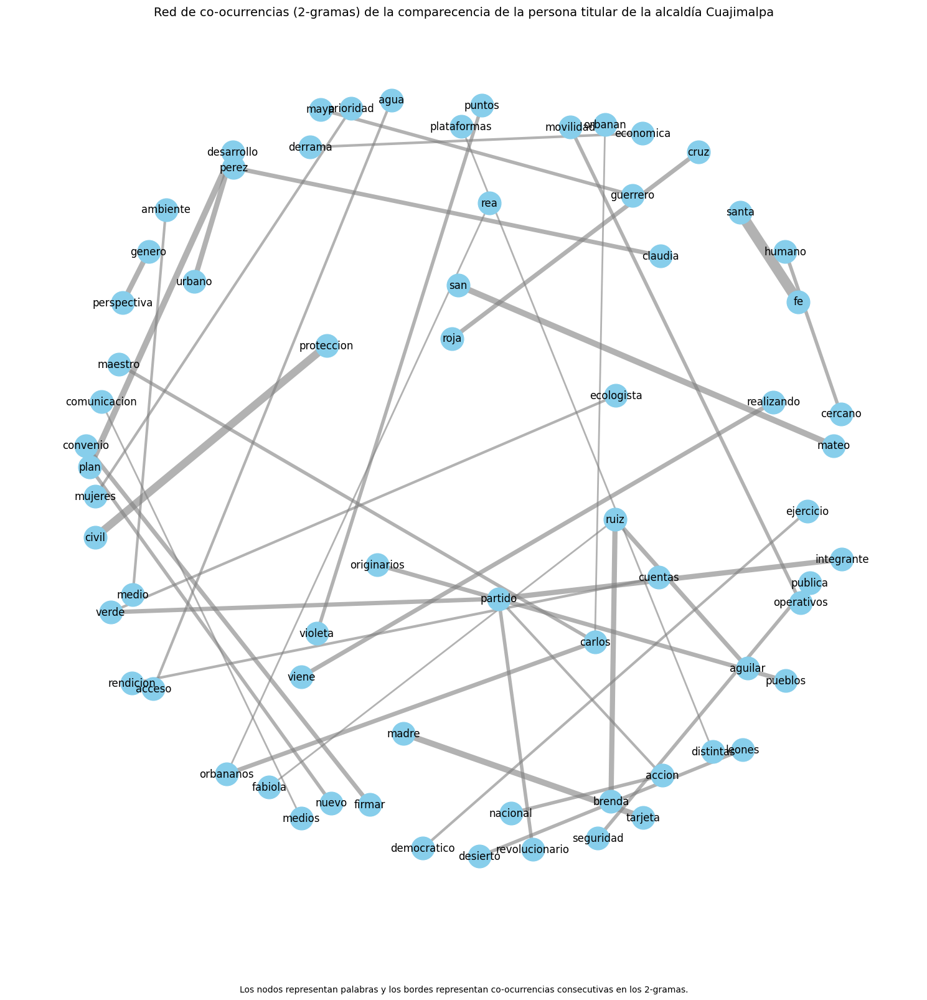

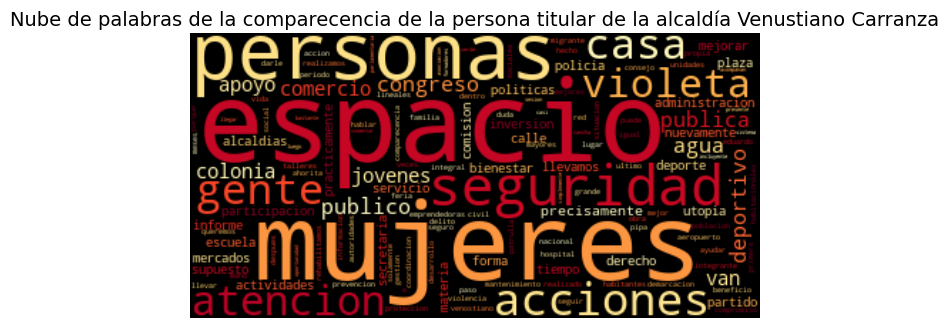

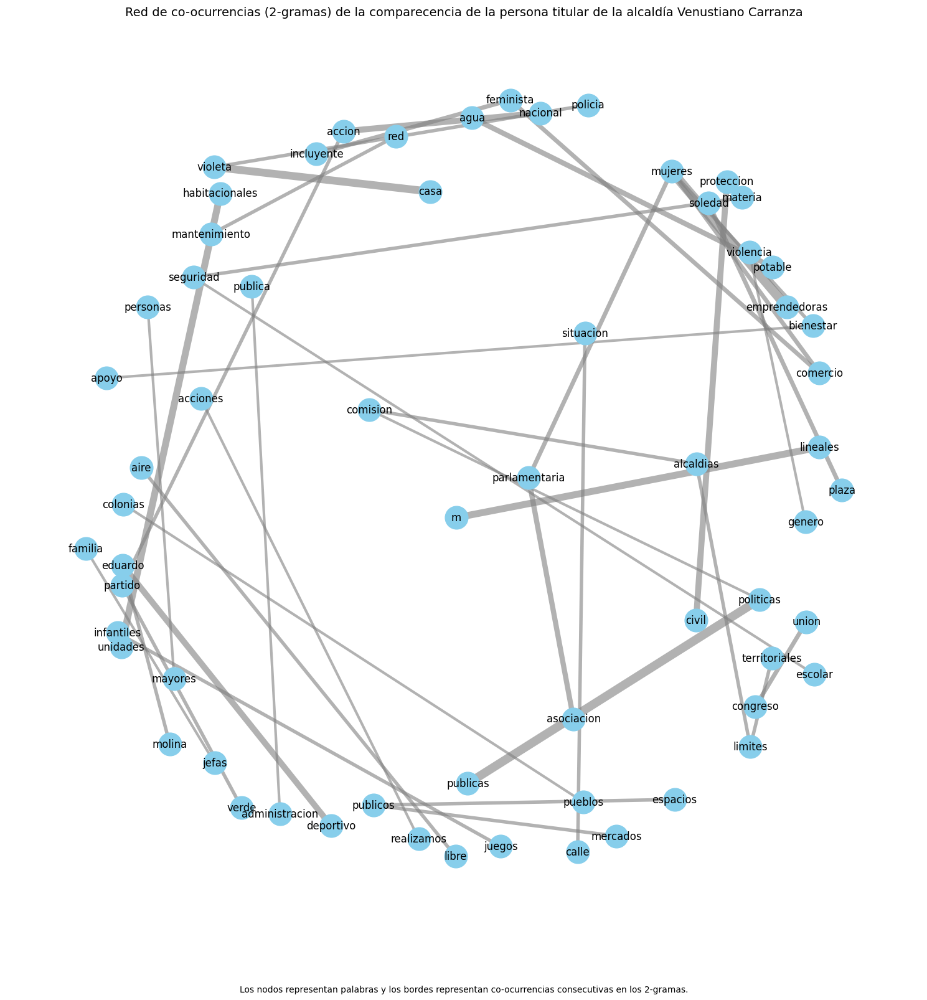

In [27]:
# Loop sobre cada alcaldía
for alcaldia, video_id in videos.items():
    print(f"🧾 Procesando alcaldía: {alcaldia}")

    try:
        # 1. Extraer y limpiar texto
        texto_limpio = extraer_y_limpiar_transcripcion(video_id, stopwords)

        # 2. Nube de palabras
        plt.figure(figsize=(6, 6))
        wc = WordCloud(
            background_color="black",
            max_words=150,
            colormap="YlOrRd",
            collocations=False,
            stopwords=stopwords,
        ).generate(texto_limpio)

        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Nube de palabras de la comparecencia de la persona titular de la alcaldía {alcaldia}", fontsize=14)
        plt.tight_layout()
        #Save the figure
        plt.savefig(f"nube_palabras_{alcaldia}.png", bbox_inches='tight', dpi=300)


        # 3. Graficar n-gramas
        lista_ngrama = list(ngrams(texto_limpio.split(), 2))
        contador = Counter(lista_ngrama)
        top_ngrama = contador.most_common(40)
        G = nx.Graph()
        for grama, peso in top_ngrama:
            for i in range(len(grama) - 1):
                G.add_edge(grama[i], grama[i + 1], weight=peso)
        plt.figure(figsize=(15, 15))
        pos = nx.spring_layout(G, k=2)
        edges = G.edges(data=True)
        pesos = [d['weight'] for (_, _, d) in edges]
        nx.draw_networkx_nodes(G, pos, node_size=700, node_color="skyblue")
        nx.draw_networkx_edges(G, pos, width=pesos, edge_color="gray", alpha=0.6)
        nx.draw_networkx_labels(G, pos, font_size=12, font_family="sans-serif")
        plt.axis("off")
        plt.figtext(
            0.5, -0.05,
            f"Los nodos representan palabras y los bordes representan co-ocurrencias consecutivas en los 2-gramas.",
            wrap=True, horizontalalignment='center', fontsize=10
        )
        plt.tight_layout()
        #Save the figure
        #plt.savefig(f"red_coocurrencias_{alcaldia}.png", bbox_inches='tight', dpi=300)
        plt.title(f"Red de co-ocurrencias (2-gramas) de la comparecencia de la persona titular de la alcaldía {alcaldia}", fontsize=14)
        plt.savefig(f"red_coocurrencias_{alcaldia}.png", bbox_inches='tight', dpi=100)
    except Exception as e:
        print(f"❌ Error procesando {alcaldia}: {e}")
